## Final Model Training With Engineered Features

In [1]:
import pandas as pd

In [2]:
df = pd.read_csv("../../data/interim/student-final-engineered.csv")

In [3]:
df.head()

,absences,studytime,freetime,health,goout,Dalc,Walc,higher_yes,schoolsup_yes,romantic_yes,...,alc_total,study_absence_ratio,alc_goout,absences_bin_low,absences_bin_medium,absences_bin_high,goout_binned_medium,goout_binned_high,alc_level_moderate,alc_level_high
0,6,2,3,3,4,1,1,True,True,False,...,2,0.285714,8,False,True,False,True,False,False,False
1,4,2,3,3,3,1,1,True,False,False,...,2,0.400000,6,False,True,False,True,False,False,False
2,10,2,3,3,2,2,3,True,True,False,...,5,0.181818,10,False,True,False,False,False,True,False
3,2,3,2,5,2,1,1,True,False,True,...,2,1.000000,4,True,False,False,False,False,False,False
4,4,2,3,5,2,1,2,True,False,False,...,3,0.400000,6,False,True,False,False,False,False,False


In [9]:
df.isnull().sum()

absences                 0
studytime                0
freetime                 0
health                   0
goout                    0
Dalc                     0
Walc                     0
higher_yes               0
schoolsup_yes            0
romantic_yes             0
paid_yes                 0
guardian_mother          0
guardian_other           0
Mjob_health              0
Mjob_other               0
Mjob_services            0
Mjob_teacher             0
reason_home              0
reason_other             0
reason_reputation        0
internet_yes             0
sex_M                    0
subject_por              0
at_risk                240
alc_total                0
study_absence_ratio      0
alc_goout                0
absences_bin_low         0
absences_bin_medium      0
absences_bin_high        0
goout_binned_medium      0
goout_binned_high        0
alc_level_moderate       0
alc_level_high           0
dtype: int64

In [4]:
X = df.drop(columns=["at_risk"], axis=1)
y = df["at_risk"]

In [5]:
print("NaN values in y:", y.isna().sum())
print("NaN values in X:", X.isna().sum().sum())

NaN values in y: 240
NaN values in X: 0


In [6]:
# Remove rows with NaN in y or any feature in X
mask = (~y.isna()) & (~X.isna().any(axis=1))
X = X[mask]
y = y[mask]

### Train/Test/CV Split

In [7]:
from sklearn.model_selection import train_test_split

In [8]:
# Test Set
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

In [10]:
# CV Set
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, stratify=y_temp, random_state=42
)

### Train Using XGBoost

In [11]:
from xgboost import XGBClassifier

In [12]:
# Compute updated scale_pos_weight using training data
scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum()

In [16]:
xgb_final = XGBClassifier(
    learning_rate=0.5,
    max_depth=3,
    n_estimators=500,
    scale_pos_weight=scale_pos_weight,
    use_label_encoder=False,
    eval_metric="logloss",
    early_stopping_rounds=20,
    random_state=42
)

xgb_final.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    verbose=True
)

[0]	validation_0-logloss:0.69769
[1]	validation_0-logloss:0.67871


/home/timmy/life-factors-and-student-performace/.venv/lib/python3.12/site-packages/xgboost/callback.py:386: UserWarning: [17:12:47] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  self.starting_round = model.num_boosted_rounds()


[2]	validation_0-logloss:0.69377
[3]	validation_0-logloss:0.69333
[4]	validation_0-logloss:0.72748
[5]	validation_0-logloss:0.72561
[6]	validation_0-logloss:0.74014
[7]	validation_0-logloss:0.73215
[8]	validation_0-logloss:0.73180
[9]	validation_0-logloss:0.72929
[10]	validation_0-logloss:0.74842
[11]	validation_0-logloss:0.75754
[12]	validation_0-logloss:0.76483
[13]	validation_0-logloss:0.79553
[14]	validation_0-logloss:0.79723
[15]	validation_0-logloss:0.80929
[16]	validation_0-logloss:0.81922
[17]	validation_0-logloss:0.83432
[18]	validation_0-logloss:0.83969
[19]	validation_0-logloss:0.83516
[20]	validation_0-logloss:0.84320
[21]	validation_0-logloss:0.83809


,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,20
,enable_categorical,False
,eval_metric,'logloss'


In [17]:
from sklearn.metrics import classification_report

y_pred = xgb_final.predict(X_test)
print(classification_report(y_test, y_pred, digits=4))

              precision    recall  f1-score   support

         0.0     0.7000    0.4912    0.5773        57
         1.0     0.3556    0.5714    0.4384        28

    accuracy                         0.5176        85
   macro avg     0.5278    0.5313    0.5078        85
weighted avg     0.5865    0.5176    0.5315        85



### Hyperparameter Tuning With CV Grid Search

In [ ]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier

xgb = XGBClassifier(
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)

param_grid = {
    "n_estimators": [50, 100, 150],
    "max_depth": [3, 5, 7, 9],
    "learning_rate": [0.05, 0.1, 0.2, 0.3, 0.5],
    "scale_pos_weight": [1, scale_pos_weight, 3, 4, 5],
    "subsample": [0.7, 0.9, 1.0],
    "colsample_bytree": [0.7, 0.9, 1.0],
    "reg_alpha": [0, 0.1, 0.5, 1],
    "reg_lambda": [1, 1.5, 2, 3]
}

grid = GridSearchCV(
    xgb,
    param_grid,
    scoring='f1',
    cv=5,
    verbose=1,
    n_jobs=-1
)

grid.fit(X_train, y_train)

Fitting 5 folds for each of 43200 candidates, totalling 216000 fits


/home/timmy/life-factors-and-student-performace/.venv/lib/python3.12/site-packages/xgboost/training.py:199: UserWarning: [17:08:52] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/timmy/life-factors-and-student-performace/.venv/lib/python3.12/site-packages/xgboost/training.py:199: UserWarning: [17:08:52] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/timmy/life-factors-and-student-performace/.venv/lib/python3.12/site-packages/xgboost/training.py:199: UserWarning: [17:08:52] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/timmy/life-factors-and-student-performace/.venv/lib/python3.12/site-packages/xgboost/training.py:199: UserWarning: [17:08:52] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_labe

In [ ]:
print("Best params:", grid.best_params_)
print("Best F1 score (CV):", grid.best_score_)

Best params: {'colsample_bytree': 0.9, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1, 'scale_pos_weight': 5, 'subsample': 0.9}
Best F1 score (CV): 0.5026892937839527


### Re-Train Final Model With Best Parameters

In [13]:
scale_pos_weight

np.float64(2.073170731707317)

In [14]:
xgb_final = XGBClassifier(
    learning_rate=0.05,
    max_depth=3,
    n_estimators=50,
    scale_pos_weight=scale_pos_weight,
    reg_alpha=0.5,
    reg_lambda=1,
    colsample_bytree=0.9,
    subsample=0.9,
    use_label_encoder=False,
    eval_metric="logloss",
    early_stopping_rounds=20,
    random_state=42
)

xgb_final.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    verbose=True
)

[0]	validation_0-logloss:0.69166
[1]	validation_0-logloss:0.68966
[2]	validation_0-logloss:0.68534
[3]	validation_0-logloss:0.68407
[4]	validation_0-logloss:0.68311
[5]	validation_0-logloss:0.68457
[6]	validation_0-logloss:0.68263
[7]	validation_0-logloss:0.68176
[8]	validation_0-logloss:0.68043
[9]	validation_0-logloss:0.68082
[10]	validation_0-logloss:0.67987
[11]	validation_0-logloss:0.68090
[12]	validation_0-logloss:0.68000
[13]	validation_0-logloss:0.68009
[14]	validation_0-logloss:0.68054
[15]	validation_0-logloss:0.68137
[16]	validation_0-logloss:0.68244
[17]	validation_0-logloss:0.68080
[18]	validation_0-logloss:0.68081
[19]	validation_0-logloss:0.68112
[20]	validation_0-logloss:0.68000
[21]	validation_0-logloss:0.67922
[22]	validation_0-logloss:0.67862
[23]	validation_0-logloss:0.68145
[24]	validation_0-logloss:0.68064
[25]	validation_0-logloss:0.67877
[26]	validation_0-logloss:0.67912
[27]	validation_0-logloss:0.67813


/home/timmy/life-factors-and-student-performace/.venv/lib/python3.12/site-packages/xgboost/callback.py:386: UserWarning: [20:04:11] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  self.starting_round = model.num_boosted_rounds()


[28]	validation_0-logloss:0.67887
[29]	validation_0-logloss:0.68053
[30]	validation_0-logloss:0.68107
[31]	validation_0-logloss:0.68205
[32]	validation_0-logloss:0.68122
[33]	validation_0-logloss:0.68048
[34]	validation_0-logloss:0.68085
[35]	validation_0-logloss:0.68046
[36]	validation_0-logloss:0.68045
[37]	validation_0-logloss:0.67896
[38]	validation_0-logloss:0.67963
[39]	validation_0-logloss:0.67998
[40]	validation_0-logloss:0.68061
[41]	validation_0-logloss:0.68137
[42]	validation_0-logloss:0.68431
[43]	validation_0-logloss:0.68426
[44]	validation_0-logloss:0.68401
[45]	validation_0-logloss:0.68404
[46]	validation_0-logloss:0.68660


,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,0.9
,device,None
,early_stopping_rounds,20
,enable_categorical,False
,eval_metric,'logloss'


In [15]:
from sklearn.metrics import classification_report

y_pred = xgb_final.predict(X_test)
print(classification_report(y_test, y_pred, digits=4))

              precision    recall  f1-score   support

         0.0     0.7200    0.6316    0.6729        57
         1.0     0.4000    0.5000    0.4444        28

    accuracy                         0.5882        85
   macro avg     0.5600    0.5658    0.5587        85
weighted avg     0.6146    0.5882    0.5976        85



### Visualization

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

#### Actual vs Predicted Plot

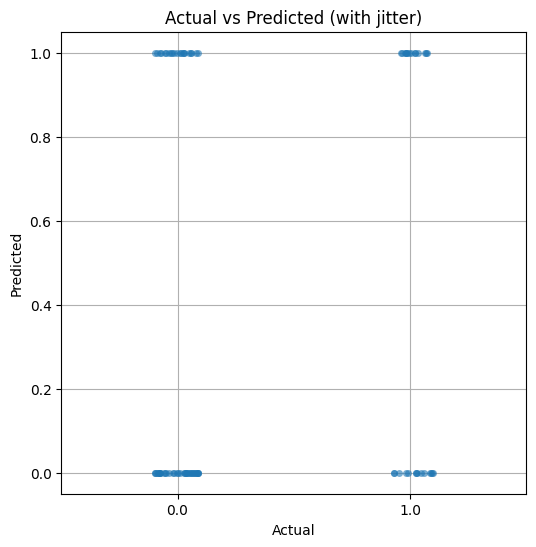

In [17]:
plt.figure(figsize=(6, 6))
sns.stripplot(x=y_test, y=y_pred, jitter=True, alpha=0.6)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs Predicted (with jitter)")
plt.grid(True)
plt.show()

#### Confusion Matrix

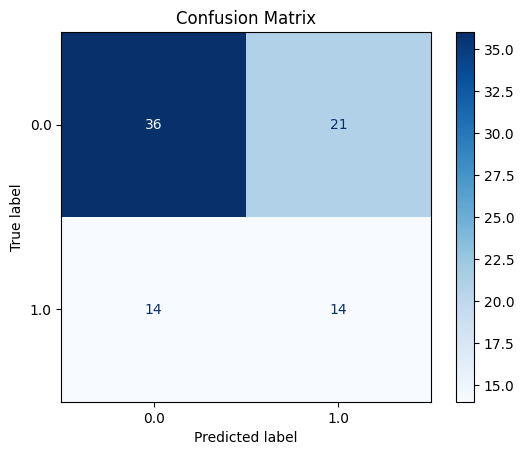

In [18]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

In [19]:
import joblib

In [20]:
joblib.dump(xgb_final, "../../models/combined_xgb_final_model.joblib")

['../../models/combined_xgb_final_model.joblib']

In [ ]:
import pickle
import json

with open("../../models/combined_scaler.pkl", "wb") as f:
    pickle.dump(scaler, f)

with open("../../models/combined_feature_names.json", "w") as f:
    json.dump(list(X.columns), f)